In [1]:
"""
script to load sim and plot
"""

from netpyne import sim
from matplotlib import pyplot as plt
import os
import pickle as pkl
import numpy as np

numprocs=1



Start time:  2025-07-29 11:56:26.897822
Loading file v9_batch2/v9_batch2_0_0_data.pkl ... 
  Done; file loading time = 5.36 s
Loading simConfig...
Loading netParams...
Loading net...
  Created 33738 cells
  Created 0 connections
  Created 49430 stims
  Done; re-instantiate net time = 0.43 s
Loading simData...
Recording 0 traces of 0 types on node 0
Preparing spike data...
Plotting spike frequency...
Preparing spike data...


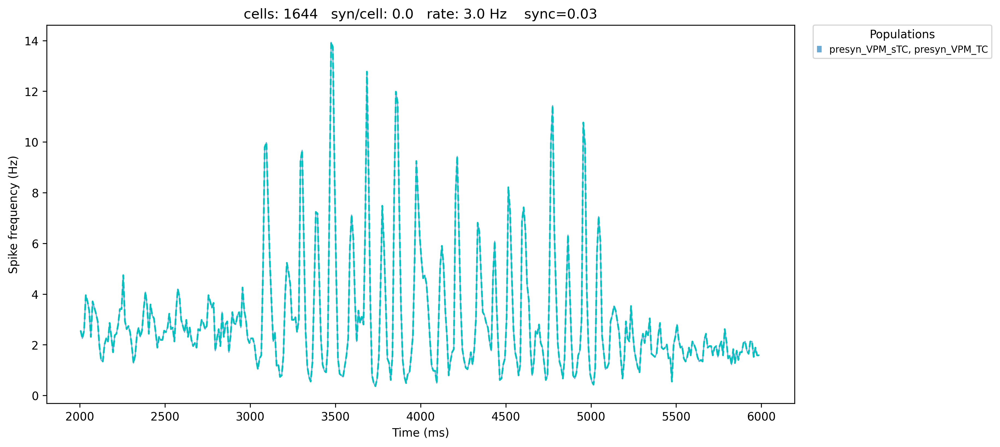

In [2]:
FR_TC = []
vl = []

for ib in range(2,3):

    filename = 'v9_batch'+str(ib)  + '/' +'v9_batch'+str(ib) + '_0_0_data.pkl'

    sim.load(filename, instantiate=True, instantiateConns = False, instantiateStims = False, instantiateRxD = False, createNEURONObj = False)


    timeRange = [2000,6000]  # 'VPM_TC','ss_RTN_m', 
    binSize = 10
    sim.analysis.plotSpikeHist(include=[['presyn_VPM_sTC', 'presyn_VPM_TC']], binSize=binSize, figSize=(18, 6.0), fontSize = 12, legend=False, showFig= False,
                                        timeRange = timeRange, graphType = 'bar', measure = 'rate', linewidth=5, dpi=300, saveData=False, saveFig=False);

    SpikeHist = sim.analysis.prepareSpikeHist(include=[['presyn_VPM_sTC', 'presyn_VPM_TC']], timeRange = timeRange)
    aa, bb, = np.histogram(SpikeHist['spkTimes'],bins=range(timeRange[0],timeRange[1]+1,binSize))
    timefactor = binSize*1644/(1000)
    plt.plot(bb[1:]-binSize/2, aa/timefactor, 'c--')
    plt.show()
    FR_TC.append(aa/timefactor)

    # for val in sim.cfg.IClamp[2:]:
    #     vl.append(val['start'])
    # sim.analysis.plotRaster(**{'include': ['VPM_TC','ss_RTN_m','VPM_sTC'], 'saveFig': False, 'showFig': False, 'popRates': True,'orderInverse': True, 
    #                         'timeRange': timeRange, 'figSize': (8,4), 'fontSize':4, 'lw': 1, 'markerSize':1, 'marker': 'o', 'dpi': 200})
    
    # for pop in ['VPM_sTC', 'VPM_TC','ss_RTN_m']:
    #     sim.analysis.plotTraces(include= [pop], timeRange=timeRange, overlay=True, oneFigPer='trace', ylim=[-90,65], subtitles= True, axis=True, scaleBarLoc=1, 
    #                         figSize=(12, 4), fontSize=8, showFig=False, saveFig=False);

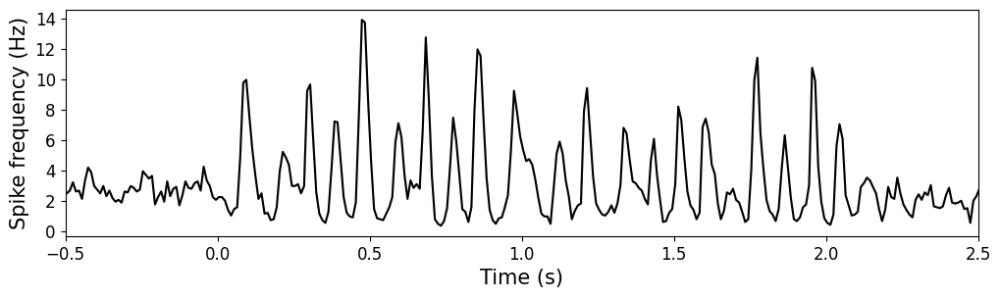

In [3]:
plt.figure(figsize=(12,3))
for i in range(1):
    plt.plot((bb[1:]-3000-binSize/2)/1000, FR_TC[i],'gray', alpha =0.25)
plt.plot((bb[1:]-3000-binSize/2)/1000, np.mean(FR_TC, axis=0),'k')
plt.ylabel('Spike frequency (Hz)', size= 15)
plt.xlabel('Time (s)', size= 15)
plt.yticks(size= 12)
plt.xlim(-0.5,2.5)
plt.vlines((np.array(vl)-3000)/1000, ymin=15,ymax = 20, color='blue', linestyles='dashed', alpha =0.25)
# plt.plot([2.0,2.0], [0,20],'--k')
plt.xticks(size= 12);

## Save .mat

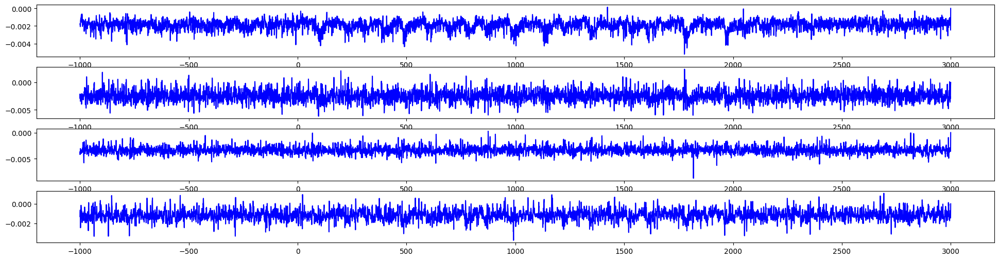

In [5]:
LFP_all = np.array(sim.allSimData['LFP']).transpose()
t = np.arange(-1000,3000, 0.5) 
plt.figure(figsize=(24,6))
for i in range(4):
    plt.subplot(4,1,1+i)
    plt.plot(t,  - LFP_all[i][4000:12000], color= 'blue', alpha = 1.0)
plt.show()

In [6]:
timeRange = [2000,6000]  

In [7]:
L23E = sim.cfg.S1cells[48:49]
L13I = sim.cfg.S1cells[0:47]+sim.cfg.S1cells[48:51]

L4E = sim.cfg.S1cells[73:74] + sim.cfg.S1cells[77:79]
L4I = [cell for cell in sim.cfg.S1cells[51:79] if cell not in L4E]

L5E = sim.cfg.S1cells[119:123]
L5I = sim.cfg.S1cells[79:119]

L6E = sim.cfg.S1cells[123:124] + sim.cfg.S1cells[138:139] + sim.cfg.S1cells[162:165]
L6I = [cell for cell in sim.cfg.S1cells[123:165] if cell not in L6E]

TH = ['presyn_VPM_sTC', 'presyn_VPM_TC']

In [8]:
len(sim.cfg.S1cells), len(L13I), len(L23E), len(L4I), len(L4E), len(L5I), len(L5E), len(L6I), len(L6E)

(165, 50, 1, 25, 3, 40, 4, 37, 5)

Preparing spike data...


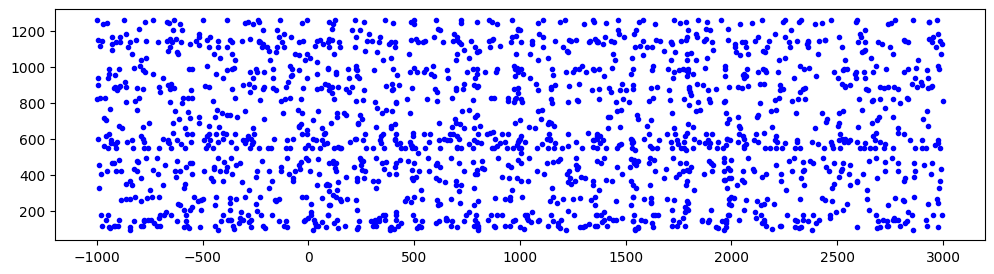

Preparing spike data...


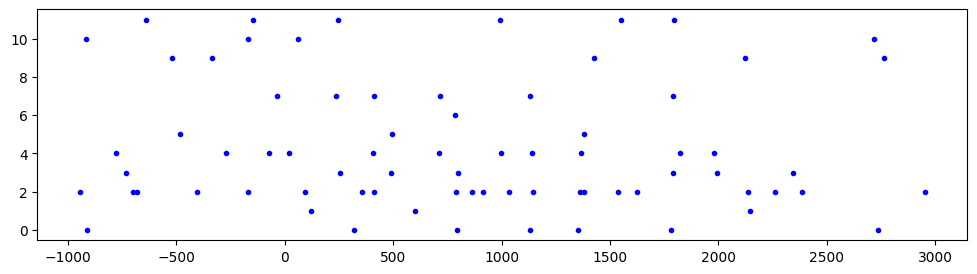

Preparing spike data...


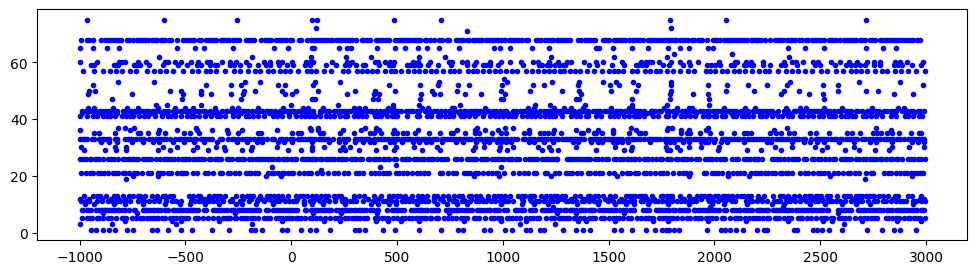

Preparing spike data...


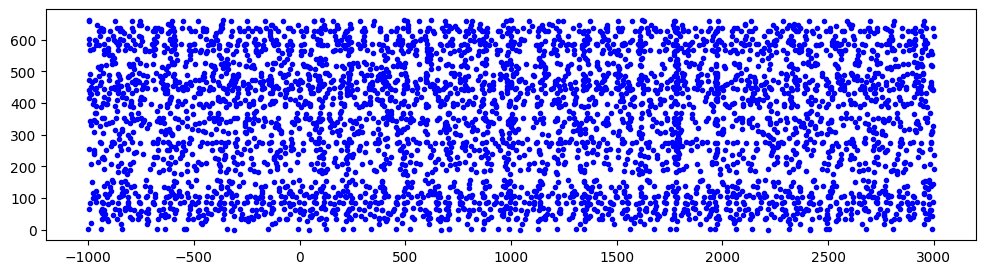

Preparing spike data...


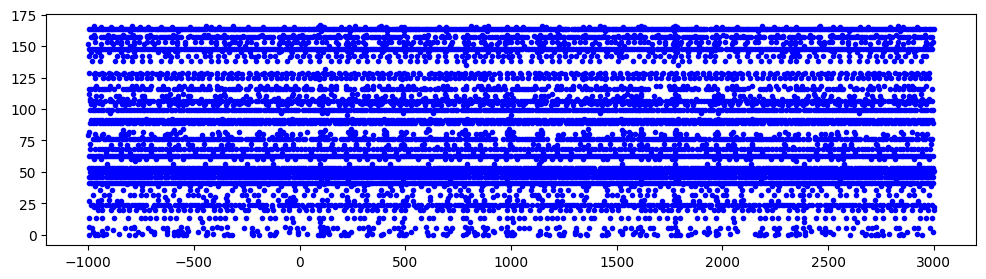

Preparing spike data...


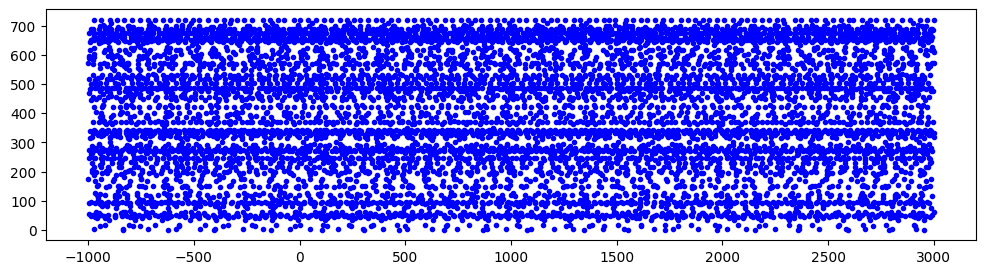

Preparing spike data...


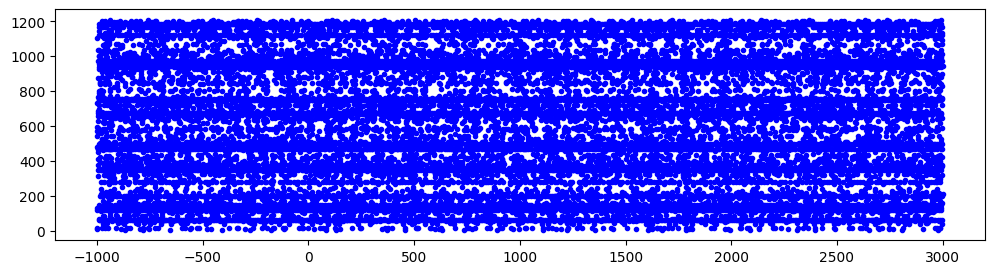

Preparing spike data...


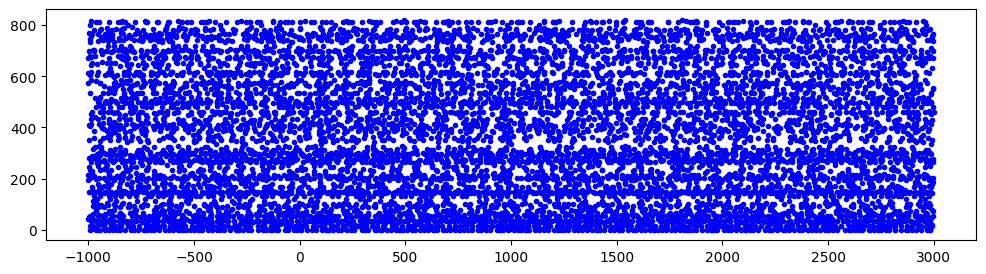

Preparing spike data...


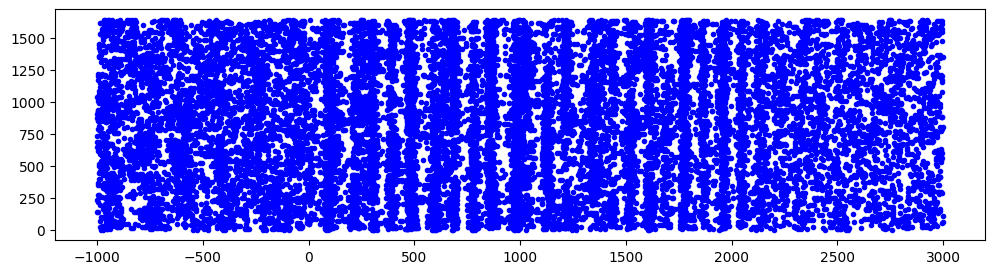

In [9]:
rastersPops = ['L13I', 'L23E', 'L4I', 'L4E', 'L5I', 'L5E', 'L6I', 'L6E', 'TH']
rasters = {}
for ii,pops in enumerate(rastersPops):
    rasters[pops] = {}

for ii,pops in enumerate([L13I, L23E, L4I, L4E, L5I, L5E, L6I, L6E, TH]):
    plt.figure(figsize=(12,3))
    ST = sim.analysis.prepareSpikeData(**{'include': pops, 'timeRange': timeRange, 'orderBy': 'y'})
    ST['spkTimes'] = [float("%.2f" % (val-3000)) for val in ST['spkTimes']]
    rasters[rastersPops[ii]]['spkTimes'] = ST['spkTimes']
    rasters[rastersPops[ii]]['spkInds'] = ST['spkInds']
    plt.plot((ST['spkTimes']),ST['spkInds'], 'b.')
    plt.show()

In [10]:
rasters.keys(), rasters['L13I'].keys()

(dict_keys(['L13I', 'L23E', 'L4I', 'L4E', 'L5I', 'L5E', 'L6I', 'L6E', 'TH']),
 dict_keys(['spkTimes', 'spkInds']))

In [11]:
rasters['L13I']['spkInds'][0], t[0],  LFP_all[3][4000:12000][0]

(821, -1000.0, 0.001308756374401944)

In [12]:
sim.cfg.recordLFP

[[0, 500, 0], [0, 1000, 0], [0, 1500, 0], [0, 2000, 0]]

In [13]:
filename

'v9_batch2/v9_batch2_0_0_data.pkl'

In [14]:
from scipy import io

#------------------------------------------------------------------------------ 
outfn = 'v9_batch2/v9_batch2_0_0_data.mat'

matDat =  { 'L13IspkTime': rasters['L13I']['spkTimes'], 'L13IspkID': rasters['L13I']['spkInds'], 
            'L23EspkTime': rasters['L23E']['spkTimes'], 'L23EspkID': rasters['L23E']['spkInds'], 
            'L4IspkTime': rasters['L4I']['spkTimes'], 'L4IspkID': rasters['L4I']['spkInds'],
            'L4EspkTime': rasters['L4E']['spkTimes'], 'L4EspkID': rasters['L4E']['spkInds'],
            'L5IspkTime': rasters['L5I']['spkTimes'], 'L5IspkID': rasters['L5I']['spkInds'],
            'L5EspkTime': rasters['L5E']['spkTimes'], 'L5EspkID': rasters['L5E']['spkInds'],
            'L6IspkTime': rasters['L6I']['spkTimes'], 'L6IspkID': rasters['L6I']['spkInds'],
            'L6EspkTime': rasters['L6E']['spkTimes'], 'L6EspkID': rasters['L6E']['spkInds'],
            'THspkTime': rasters['TH']['spkTimes'], 'THspkID': rasters['TH']['spkInds'],       
            'LFP_postions_y_um': [500, 1000, 1500, 2000] , 'LFP_t': t, 'LFP_0': LFP_all[0][4000:12000], 
            'LFP_1': LFP_all[1][4000:12000] , 'LFP_2': LFP_all[2][4000:12000], 'LFP_3': LFP_all[3][4000:12000]}

io.savemat(outfn, matDat)

In [4]:
timeRange = [2000,6000] 

Preparing spike data...
Plotting raster...


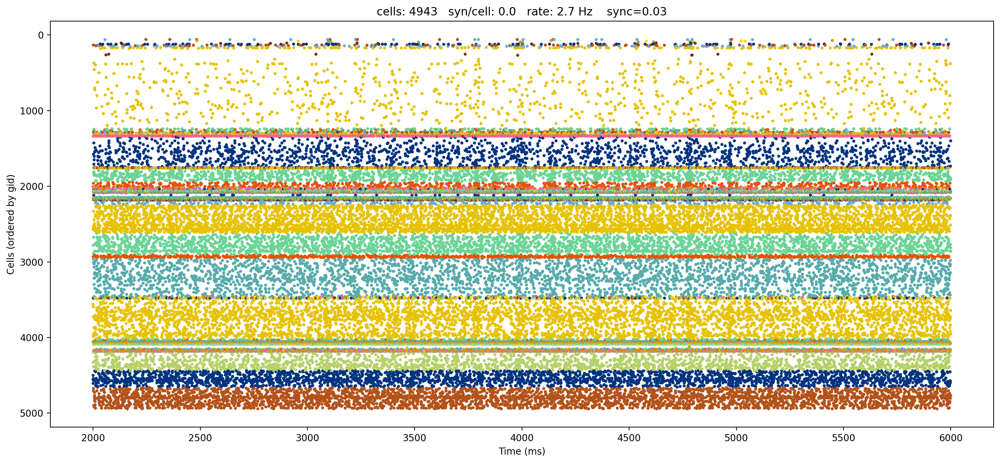

In [5]:
# 'presyn_VPL_sTC', 'presyn_VPM_sTC', 'presyn_POm_sTC_s1'
sim.analysis.plotRaster(**{'include': sim.cfg.S1cells, 'saveFig': False, 'showFig': False, 'popRates': True,'orderInverse': True, 'labels': None,
                           'timeRange': timeRange, 'figSize': (15,7), 'fontSize':4, 'lw': 1, 'markerSize':1, 'marker': 'o', 'dpi': 200})

Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace
Plotting recorded cell traces ... trace


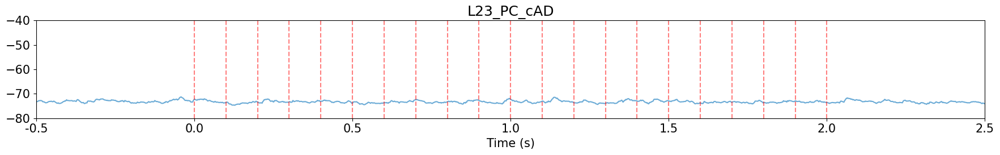

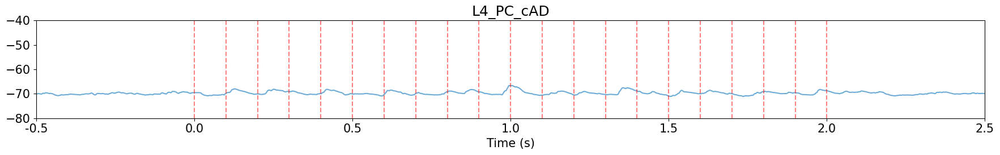

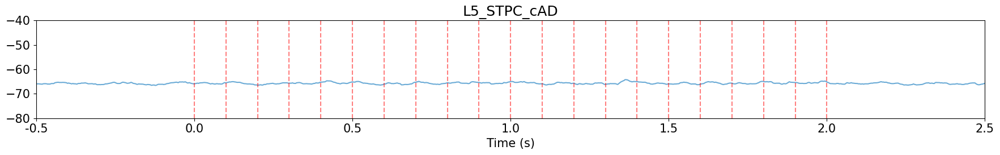

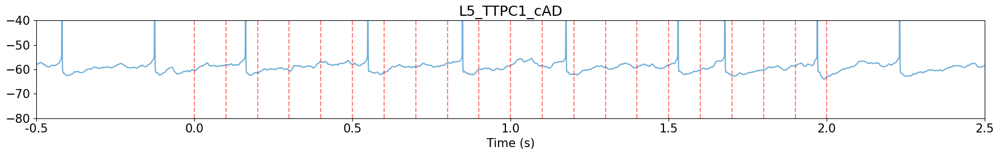

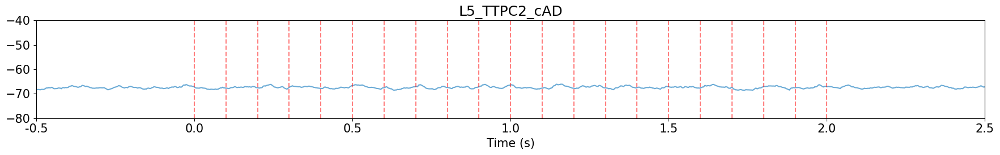

...

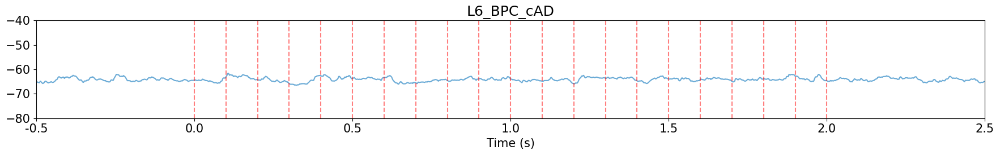

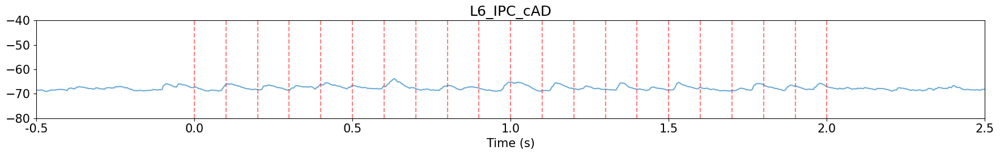

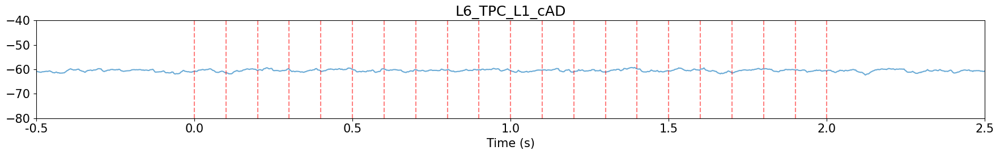

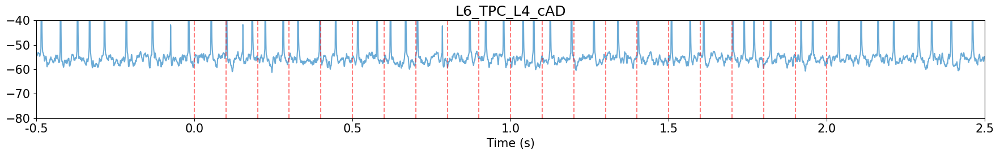

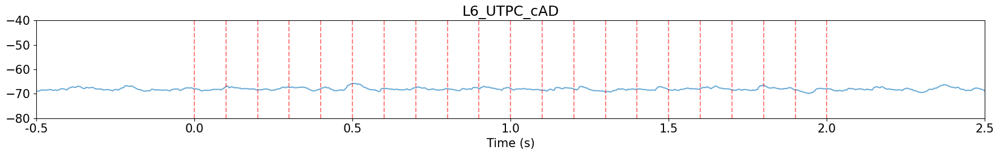

In [6]:
for pop in sim.cfg.S1cells:
    if 'PC' in pop:
        sim.analysis.plotTraces(include= [pop], timeRange=timeRange, overlay=True, oneFigPer='trace', ylim=[-80,-40], subtitles= True, axis=True, scaleBarLoc=1, 
                            figSize=(18, 3), fontSize=15, showFig=False, saveFig=False);
        plt.title(pop)
        plt.xlim(2500,5500)
        plt.xlabel('Time (s)')
        plt.vlines(np.linspace(3000,5000,21), ymin=-80,ymax = -40, color='red',linestyles='dashed', alpha =0.5)
        plt.xticks(np.linspace(2500,5500,7),np.linspace(-0.5,2.5,7));

Preparing LFP data...
Preparing spectrogram data...
Plotting LFP spectrogram...
Preparing LFP data...
Plotting LFP time series...
Preparing LFP data...
Plotting LFP time series...
Preparing LFP data...
Preparing spectrogram data...
Plotting LFP spectrogram...
Preparing LFP data...
Plotting LFP time series...
Preparing LFP data...
Plotting LFP time series...
Preparing LFP data...
Preparing spectrogram data...
Plotting LFP spectrogram...
Preparing LFP data...
Plotting LFP time series...
Preparing LFP data...
Plotting LFP time series...
Preparing LFP data...
Preparing spectrogram data...
Plotting LFP spectrogram...
Preparing LFP data...
Plotting LFP time series...
Preparing LFP data...
Plotting LFP time series...


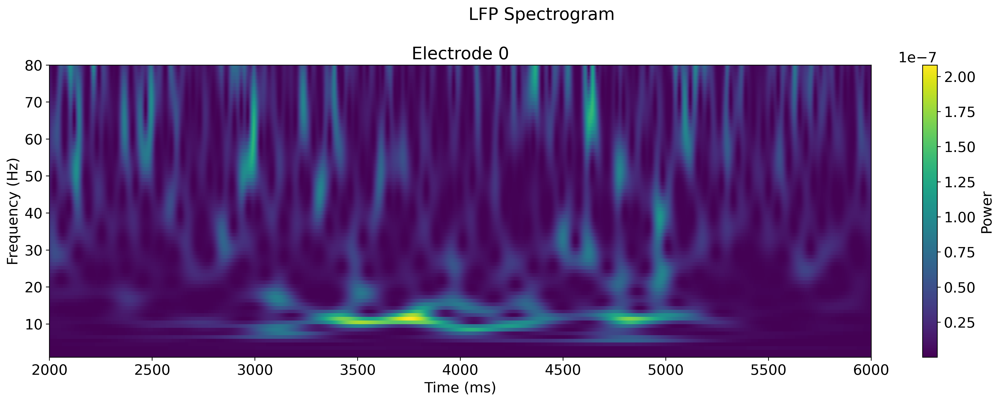

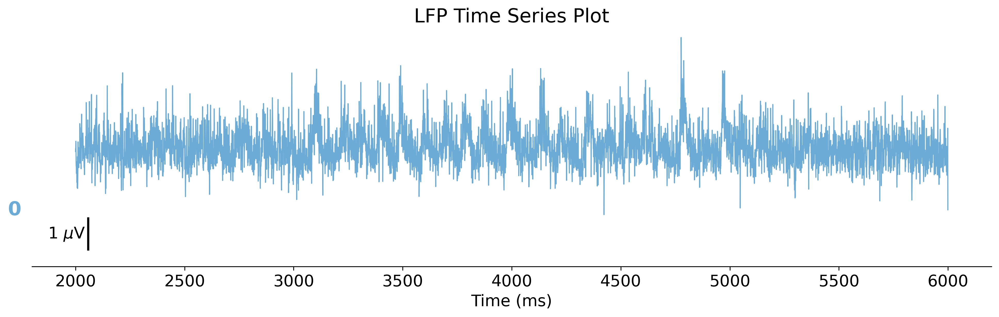

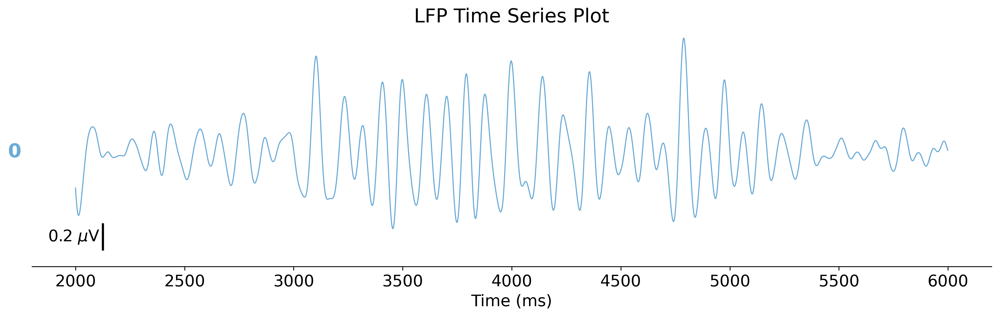

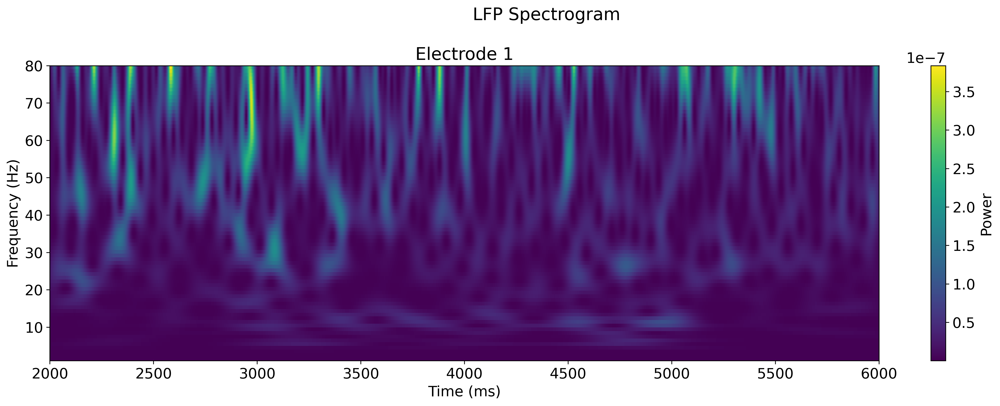

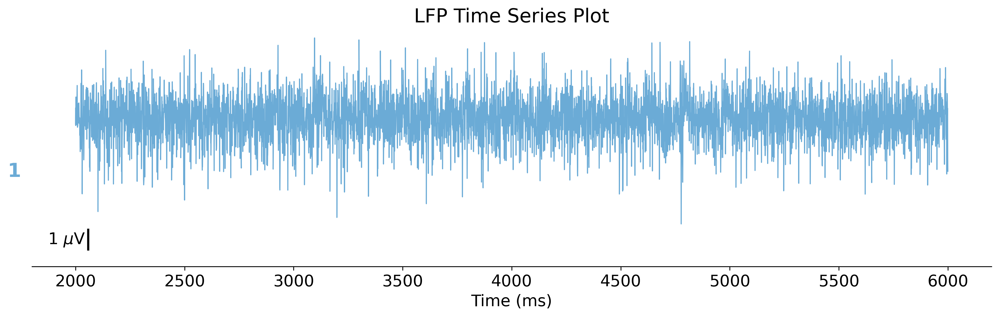

...

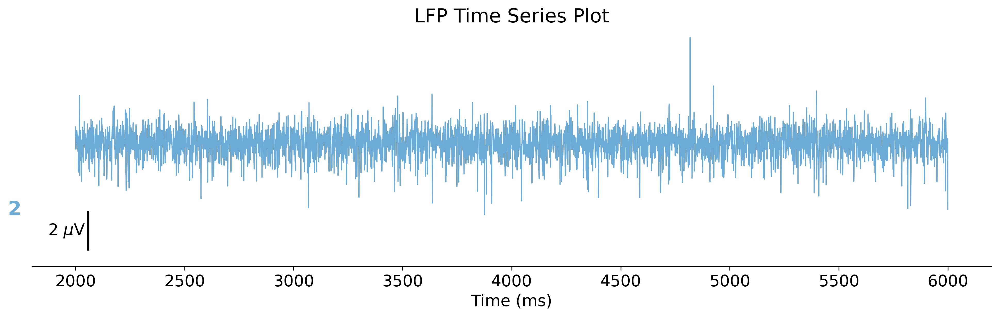

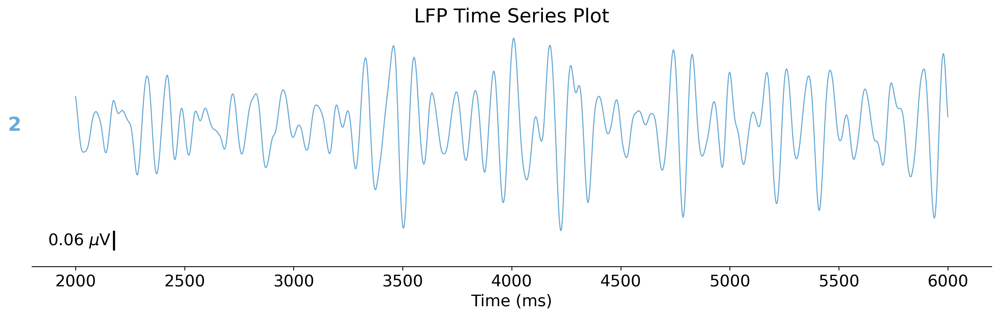

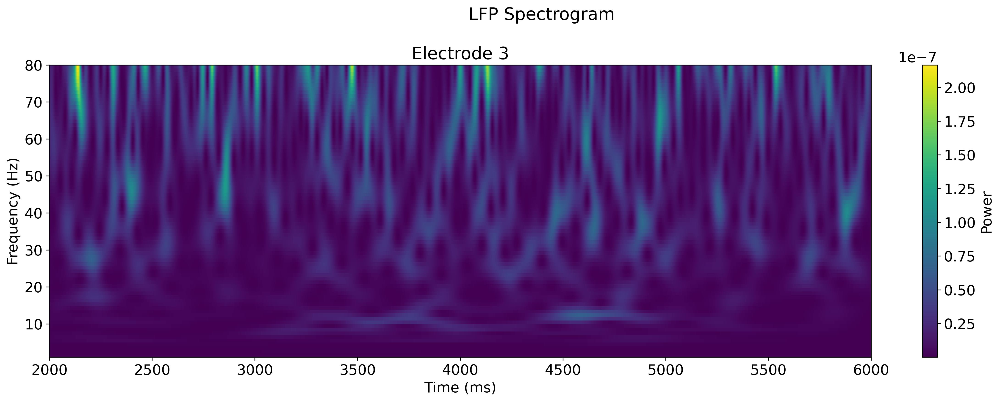

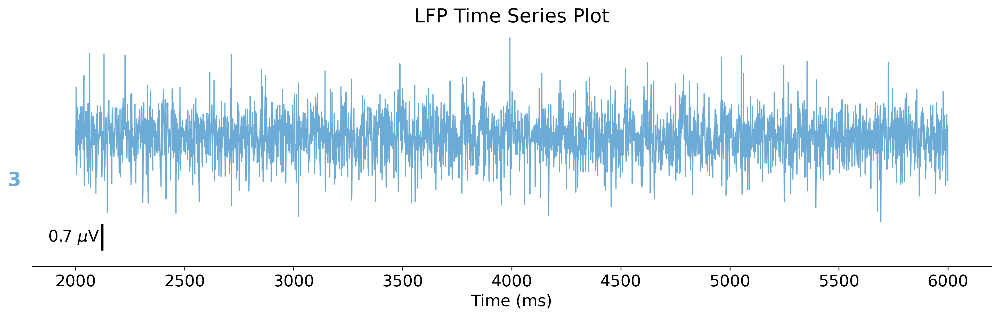

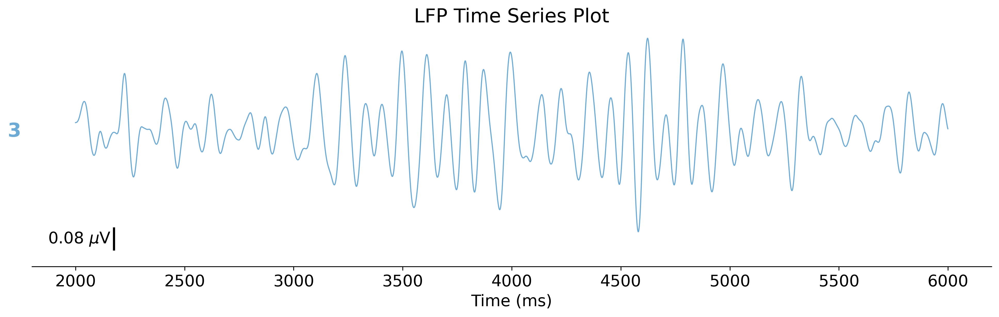

In [7]:
for ii in range(4):
        sim.analysis.plotLFP(**{'electrodes': [ii], 'lineWidth': 8, 'plots': ['spectrogram'],
                # 'filtFreq': [2,20], 'filtOrder': 2,
                'maxFreq': 80,
                'timeRange': [2000,6000], 'dpi':300,
                'figSize': (16.0,6), 'saveFig':False, 'showFig': False})
        
        sim.analysis.plotLFP(**{'plots': ['timeSeries'],
                'electrodes': [ii], 'lineWidth': 8, 
                # 'filtFreq': [200,400], 'filtOrder': 5,
                # 'timeRange': [6040,6080], 
                'timeRange': [2000,6000], 'dpi':300,
        'figSize': (16.0,4), 'saveFig':False, 'showFig': False})

        sim.analysis.plotLFP(**{'plots': ['timeSeries'],
                'electrodes': [ii], 'lineWidth': 8, 
                'filtFreq': [5,15], 'filtOrder': 2,
                # 'timeRange': [6040,6080], 
                'timeRange': [2000,6000], 'dpi':300,
        'figSize': (16.0,4), 'saveFig': False, 'showFig': False})

Preparing LFP data...
Plotting LFP time series...


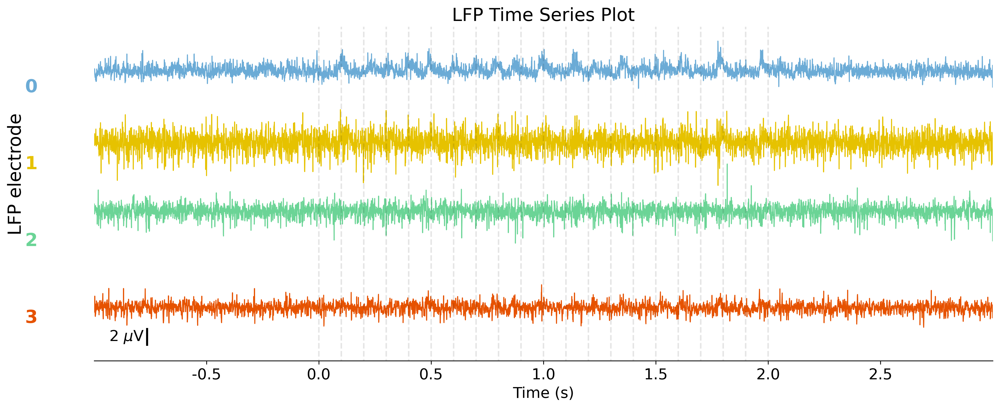

In [8]:
sim.analysis.plotLFP(**{'plots': ['timeSeries'],
                'electrodes': [0,1,2,3], 'lineWidth': 8, 
                # 'timeRange': [6040,6080], 
                'timeRange': [2000,6000], 'dpi':300,
        'figSize': (16.0,6), 'saveFig': False, 'showFig': False})
plt.xlim(2000,6000)
plt.xlabel('Time (s)')
plt.vlines(np.linspace(3000,5000,21), ymin=-1.0,ymax = 1.0, color='black',linestyles='dashed', alpha =0.1)
plt.xticks(np.linspace(2500,5500,7),np.linspace(-0.5,2.5,7));

Preparing LFP data...
Plotting LFP time series...


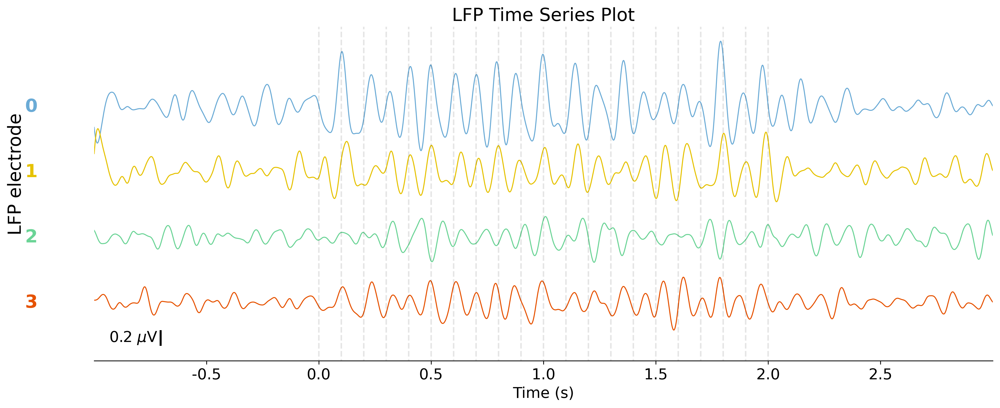

In [9]:
sim.analysis.plotLFP(**{'plots': ['timeSeries'],
                'electrodes': [0,1,2,3], 'lineWidth': 8, 
                'filtFreq': [5,15], 'filtOrder': 2,
                # 'timeRange': [6040,6080], 
                'timeRange': [2000,6000], 'dpi':300,
        'figSize': (16.0,6), 'saveFig': False, 'showFig': False})
plt.xlim(2000,6000)
plt.xlabel('Time (s)')
plt.vlines(np.linspace(3000,5000,21), ymin=-1.0,ymax = 1.0, color='black',linestyles='dashed', alpha =0.1)
plt.xticks(np.linspace(2500,5500,7),np.linspace(-0.5,2.5,7));